<p style="text-align: center; color: black; font-size: 42px;">MLA</p>
<p style="text-align: center; color: #2b2b2b; font-size: 34px;">Fast Fashion Eco Commitment Dataset</p>
<p style="text-align: center; color: #666666; font-size: 20px;"><i>(Machine Learning Analysis)</i></p>


<br>
<br>
<p  style="color:#98afbe;font-size:18px;"><i>Context and issues</i></p>


The main purpose of this analysis is to perform a **Machine Learning** based analysis on **spanish Zara items** dataset previously cleaned in the [`./EDA.ipynb`](EDA.ipynb) notebook.
The goal is to rely on the available characteristics of each garment such as its price, its category or the percentage of each material used for its design in order to predict whether or not this item has the _Zara's_ ecolabel called `join_life`.

It is therefore a `Binary Classification` problem:
- `0`: _the garment does not have the ecolabel_
- `1`: _the garment has the eco-label_

<br>

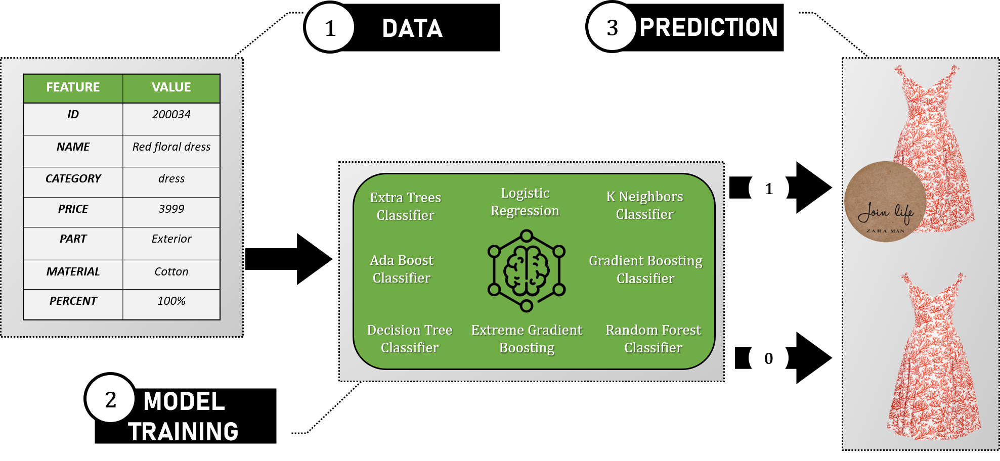

<br>
<br>

<p  style="color:#98afbe;font-size:18px;"><i>Notebook environment setup</i></p>


First of all, let's setup the notebook environment by importing python packages that will be used and set some constants variables.

In [1]:
# -- Import basic packages
import os
import pandas as pd
import numpy as np

# -- Import Machine Learning package
from pycaret.classification import ClassificationExperiment
import bctools

# -- Import visualisation package
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# -- Set table style
table_style = [
    {
        "selector":"thead",
        "props": [("background-color", "black"),
                  ("color", "white"),
                  ("border", "1.5px solid"),
                  ("font-size", "1.35rem")]
    },
    {
        "selector":"th.row_heading",
        "props": [("background-color", "darkgrey"),
                  ("color", "white"),
                  ("border", "0px solid black"),
                  ("font-size", "1.2rem"),
                  ("font-style", "italic")]
    },
]

## Feature engineering

Feature engineering is the process of _selecting_ and _transforming_ raw data into **features** that can be used as inputs to machine learning algorithms. The goal of feature engineering is to extract the most relevant and informative aspects of the data, which will enable machine learning models to make accurate predictions.

The process of feature engineering can involve a variety of techniques, such as:

- **Data cleaning/preprocessing:** _removing irrelevant or redundant data, handling missing values, and normalizing the data to ensure that all features are on the same scale_

- **Feature selection:** _identifying the most important features that contribute to the outcome and removing irrelevant or redundant features that may introduce noise or useless complexity_

- **Feature extraction:** _creating new features by combining or transforming existing features, such as using principal component analysis (PCA) or Fourier transforms_

- **Feature scaling:** _scaling the values of features to a common range, which can improve the performance of some machine learning algorithms_

In [2]:
# -- Read cleaned zara items dataset
df = pd.read_parquet(os.path.join('data', 'ml', 'zara_items.parquet'))
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 457 entries, 0 to 456
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   item_code       457 non-null    int64   
 1   item_name       457 non-null    object  
 2   item_desc       457 non-null    object  
 3   join_life       457 non-null    int32   
 4   joinlife_title  163 non-null    object  
 5   joinlife_desc   163 non-null    object  
 6   item_price      457 non-null    float64 
 7   item_category   457 non-null    category
 8   part_name       457 non-null    category
 9   material        457 non-null    category
 10  percent         457 non-null    float64 
dtypes: category(3), float64(2), int32(1), int64(1), object(4)
memory usage: 33.1+ KB


In [3]:
# -- Initialize a Classification expiriment
exp = ClassificationExperiment()

In our case, most of cleaning and preprocessing have already been carry out in the [`./EDA.ipynb`](EDA.ipynb) file. But, for machine learning algorithms performances we will perform addition transformations such as:
* [x] Setting the **target variable** (`join_life`)
* [x] Setting **categorical** and **numeric** features
* [x] Setting unused features such as item description, ecolabel title, ...
* [x] Splitting the dataset into **train set** (`80%`) and **test set** (`20%`)
* [x] **Normalizing** numerical features with `zscore` method
* [x] **Shuffling** train sets
* [x] Fixing **imbalanced** distributions between ecolabeled / not ecolabeled data passign through **over-sampling** method
* [x] Setting **cross-validation** strategy
* [x] Fixing the **randomness** of the whole experiment

**<u>Note:</u>**

Since the `EDA` revealed not only an insufficient amount of training data but also an imbalance in the distribution between eco-labeled and non-ecolabeled items we will perform an oversampling method called **ADASYN** _(Adaptive Synthetic Sampling)_ largely prefered to the basic `SMOTE` method. For the same reasons, we will use a **StratifiedKFold** method for the cross-validation.

In [4]:
# -- Set all setup argument that defining the Classification experiment
setup_opts = dict(
    data=df,
    data_func=None,
    target='join_life',
    index=False,
    train_size=.8,
    ignore_features=['item_name', 'item_desc', 'joinlife_title', 'joinlife_desc' ],
    numeric_features=['item_code', 'item_price', 'percent'],
    categorical_features=['item_category', 'part_name', 'material'],
    preprocess=True,
    normalize=True,
    normalize_method='zscore',
    data_split_shuffle=True,
    data_split_stratify=True,
    fix_imbalance=True,
    fix_imbalance_method='ADASYN',
    fold_strategy='stratifiedkfold',
    fold=5,
    n_jobs=-1,
    session_id=22,
    log_experiment=True,
    experiment_name='Eco-labels binary classification'
)

Next, let's build a `ClassificationExperiment()` instance with all the options just set above.

In [5]:
# -- Create experiment and set setup options
exp = ClassificationExperiment()
exp = exp.setup(**setup_opts)

,Description,Value
0,Session id,22
1,Target,join_life
2,Target type,Binary
3,Original data shape,"(457, 11)"
4,Transformed data shape,"(577, 31)"
5,Transformed train set shape,"(485, 31)"
6,Transformed test set shape,"(92, 31)"
7,Ignore features,4
8,Ordinal features,1
9,Numeric features,3


Have a look to _Exploratory Data Analysis_ summary if required.

In [6]:
# -- Plot EDA summary if required
# exp.eda('bokeh') # interactive
# exp.eda('svg') # Not interactive

## Naive model training

First of all,  let's try to build and fit some _basic niaive classifiers_. To compare all models we will focus on 2 metrics:
+ `Accuracy` : ratio of correct predictions to the total number of predictions made by the model
+ `AUC` _(Area Under the ROC Curve)_ : ability of the model to distinguish between positive and negative

The `AUC` measures the probability that a randomly chosen positive item will be ranked higher than a randomly chosen negative item. That is equivalent to say that the cost of misclassifying positive and negative examples is different.

So, the `AUC` seems to be the **most reliable metric** for evaluating the performance of our binary classification models.

In [7]:
# -- Print available models
exp.models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [8]:
# -- Train and select top 3 naive models
best_naive_models = exp.compare_models(exclude=['dummy', 'qda', 'nb', 'ridge'], n_select=3, sort='AUC')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.8767,0.9244,0.8462,0.8151,0.8294,0.7330,0.7343,5.9660
rf,Random Forest Classifier,0.8329,0.9164,0.7846,0.7539,0.7651,0.6359,0.6402,3.7080
lightgbm,Light Gradient Boosting Machine,0.8411,0.9139,0.8077,0.7640,0.7791,0.6558,0.6630,5.4480
et,Extra Trees Classifier,0.8521,0.9119,0.7923,0.7906,0.7883,0.6750,0.6782,6.7760
catboost,CatBoost Classifier,0.8493,0.9118,0.8000,0.7822,0.7862,0.6705,0.6752,5.6560
gbc,Gradient Boosting Classifier,0.8329,0.8962,0.7846,0.7602,0.7682,0.6381,0.6424,3.5820
ada,Ada Boost Classifier,0.7918,0.8524,0.7538,0.6942,0.7188,0.5545,0.5602,3.7840
lr,Logistic Regression,0.7370,0.8105,0.8000,0.5995,0.6839,0.4670,0.4833,7.5280
lda,Linear Discriminant Analysis,0.7123,0.8090,0.7923,0.5715,0.6623,0.4237,0.4433,3.5620
dt,Decision Tree Classifier,0.8055,0.8043,0.8000,0.6960,0.7396,0.5857,0.5953,4.0440


Processing:   0%|          | 0/55 [00:00<?, ?it/s]

In [9]:
# -- Extract the comparative naive table
comparative_naive_df = exp.pull()
# -- Show best model
best_naive_models

[XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               n_estimators=100, n_jobs=-1, num_parallel_tree=None,
               objective='binary:logistic', predictor=None, ...),
 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='gini', max_depth=None, max_features='sqrt',
                        max_leaf_nodes=None, max_samples=None,
        

## Model enhancement

Model enhancement in machine learning refers to the process of improving the performance of a trained model on a given task. This process involves identifying areas where the model is underperforming and implementing strategies to address those weaknesses.

- _Feature engineering_
- _Hyperparameter tuning_
- _Ensemble methods_
- _Regularization_
- _Data augmentation_
- _Model architecture modfiication_
- _Transfer learning_
- _..._

In this section we will try to improve our model performances.

### Ensemble model

Ensemble learning is a machine learning paradigm where multiple models (often called _weak learners_) are trained to solve the same problem and combined to get better results. The main hypothesis is that when weak models are correctly combined we can obtain more accurate and/or robust models.

A low bias and a low variance, although they most often vary in opposite directions, are the two most fundamental features expected for a model. Indeed, to be able to _solve_ a problem, the model must have enough degrees of freedom to resolve the underlying complexity of the data, but we also want it to have not too much degrees of freedom to avoid high variance and be more robust. This is the well known **bias-variance tradeoff**.

<br>

<div style="display: flex; align-items: center;">
    <img src="./assets/ensemble.png" style="height: 300px; margin-right: 20px;" />
    <div>
        <p><br>In ensemble learning theory, we call <em>weak learners</em> models that can be used as building blocks for designing more complex models by combining several of them. Most of the time, these basics models perform not so well by themselves either because they have a high bias or because they have too much variance to be robust. Then, the idea of ensemble methods is to try reducing bias and/or variance of such weak learners by combining several of them together in order to create a strong learner (or ensemble model) that achieves better performances.<br><br> In order to set up an <strong>ensemble learning method</strong>, we first need to select our base models to be aggregated. Most of the time a single base learning algorithm is used so that we have <strong>homogeneous weak learners</strong> that are trained in different ways. The ensemble model we obtain is then said to be <em>homogeneous</em>. However, there also exist some methods that use different type of base learning algorithms: some <strong>heterogeneous weak learners</strong> are then combined into an <em>heterogeneous ensembles model</em>.</p>
    </div>
</div>

<br>

There are several methods to combine these models. We can mention 3 major kinds of meta-algorithms that aims at combining _weak learners_:

- **Bagging**: considers _homogeneous weak learners_ that learns independently from each other in **_parallel_** and combines them following some kind of deterministic averaging process

- **Boosting**, considers _homogeneous weak learners_ that learns them **_sequentially_** in a very adaptative way (a base model depends on the previous ones) and combines them following a deterministic strategy

- **Stacking**, considers _heterogeneous weak learners_ that learns them in **_parallel_** and combines them by training a meta-model to output a prediction based on the different weak models predictions


Very roughly, we can say that _bagging_ will mainly focus at getting an ensemble model with **less variance** than its components whereas _boosting_ and _stacking_ will mainly try to produce strong models **less biased** than their components (even if variance can also be reduced).

Let's try to figure it out each method and compare them to find the best performances!

#### _Bagging_

**Bagging** is a technique in which multiple models are trained on different subsets of the training data. Each model is trained on a random subset of the data, and the final prediction is made by combining the predictions of all the models. Bagging reduces overfitting and variance by creating diverse models that are not too correlated with each other.

The idea of **bagging** is quite simple: we want to fit several independent models and _"average"_ their predictions in order to obtain a model with a **lower variance**. In other words, multiple _weak learners models_ are trained on different subsets of the training data and the final prediction is made by combining the predictions of all the models.

However, we can’t, in practice, fit fully independent models because it would require too much data. So, we rely on the good _"approximate properties"_ of **bootstrap samples** (_representativity_ and _independence_) to fit models that are almost independent.

<img src="./assets/bagging.png" style="height: 350px">

<br>
<br>

<table style="border-collapse:collapse;border-spacing:0" class="tg"><thead><tr><th style="background-color:#013300;border-color:inherit;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:x-large;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Advantages</th><th style="background-color:#9a0000;border-color:#009901;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:x-large;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Disadvantages</th></tr></thead><tbody><tr><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Reduce <span style="font-style:italic">over-fitting</span> especially for complex models</td><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Computationally expensive</td></tr><tr><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Improve the accuracy and stability of a model by reducing variance</td><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Not suitable for low variance models such as linear regression</td></tr></tbody></table>

<br>

Let's try combine multiple _weak models_ such as `DecisionTreeClassifier()` with **bagging** method.

In [10]:
# -- Build basic Decision Tree Classifier (weak learners)
naive_dt = exp.create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7534,0.7140,0.5769,0.6818,0.6250,0.4432,0.4467
1,0.8356,0.8466,0.8846,0.7188,0.7931,0.6591,0.6689
2,0.7671,0.7504,0.6923,0.6667,0.6792,0.4966,0.4968
3,0.8219,0.8445,0.9231,0.6857,0.7869,0.6396,0.6605
4,0.8493,0.8658,0.9231,0.7273,0.8136,0.6901,0.7039
Mean,0.8055,0.8043,0.8000,0.6960,0.7396,0.5857,0.5953
Std,0.0382,0.0604,0.1406,0.0231,0.0740,0.0974,0.1032


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [11]:
# -- Build ensemble bagging model with 20 weak learners 
naive_bagging = exp.ensemble_model(naive_dt, method='Bagging', optimize='AUC', n_estimators=20)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8219,0.8433,0.6538,0.8095,0.7234,0.5943,0.6016
1,0.8356,0.9579,0.8846,0.7188,0.7931,0.6591,0.6689
2,0.8082,0.8785,0.7692,0.7143,0.7407,0.5889,0.5899
3,0.8356,0.9362,0.8462,0.7333,0.7857,0.6535,0.6579
4,0.9178,0.9644,0.8846,0.8846,0.8846,0.8208,0.8208
Mean,0.8438,0.9160,0.8077,0.7721,0.7855,0.6633,0.6678
Std,0.0384,0.0473,0.0877,0.0660,0.0561,0.0839,0.0824


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [12]:
# -- Extract Accuracy and AUC scores
bagging_scores = exp.pull().loc['Mean'].rename('dt (bagging)')
bagging_scores

Accuracy    0.8438
AUC         0.9160
Recall      0.8077
Prec.       0.7721
F1          0.7855
Kappa       0.6633
MCC         0.6678
Name: dt (bagging), dtype: float64

#### _Boosting_

In **sequential methods** the different combined _weak models_ are no longer fitted independently from each others. The idea is to fit models **iteratively** such that the training of model at a given step depends on the models fitted at the previous steps. **Boosting** is the most famous of these approaches and it produces an ensemble model that is in general less biased than the weak learners that compose it.


Indeed, **boosting** methods work in the same spirit as **bagging** methods: we build a family of models that are aggregated to obtain a strong learner that performs better.
However, unlike **bagging** that mainly aims at reducing variance, boosting is a technique that consists in fitting sequentially multiple weak learners in a very adaptative way: each model in the sequence is fitted giving more importance to **observations** in the dataset that were badly handled by the previous models in the sequence. Intuitively, each new model focus its efforts on the most difficult observations to fit up to now, so that we obtain, at the end of the process, a strong learner with lower _bias_.

<img src="./assets/boosting.png" style="height: 350px">

<br>
<br>

<table style="border-collapse:collapse;border-spacing:0" class="tg"><thead><tr><th style="background-color:#013300;border-color:inherit;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:x-large;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Advantages</th><th style="background-color:#9a0000;border-color:#009901;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:x-large;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Disadvantages</th></tr></thead><tbody><tr><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Improve accuracy reducing bias and increasing precision</td><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">More sensitive to noisy data</td></tr><tr><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Particularly effective for <span style="font-style:italic">weak learners</span></td><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">More Prone to over-fitting for complex models</td></tr></tbody></table>

<br>

In [13]:
# -- Build ensemble bagging model with 20 basic Decision Tree Classifier (weak learners)
naive_boosting = exp.ensemble_model(naive_dt, method='Boosting', n_estimators=20)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7397,0.7034,0.5769,0.6522,0.6122,0.4175,0.4192
1,0.8219,0.8445,0.9231,0.6857,0.7869,0.6396,0.6605
2,0.7671,0.7504,0.6923,0.6667,0.6792,0.4966,0.4968
3,0.8356,0.8552,0.9231,0.7059,0.8000,0.6646,0.6819
4,0.8767,0.8871,0.9231,0.7742,0.8421,0.7423,0.7500
Mean,0.8082,0.8081,0.8077,0.6969,0.7441,0.5921,0.6017
Std,0.0490,0.0694,0.1460,0.0426,0.0850,0.1181,0.1234


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [14]:
# -- Extract Accuracy and AUC scores
boosting_scores = exp.pull().loc['Mean'].rename('dt (boosting)')
boosting_scores

Accuracy    0.8082
AUC         0.8081
Recall      0.8077
Prec.       0.6969
F1          0.7441
Kappa       0.5921
MCC         0.6017
Name: dt (boosting), dtype: float64

#### _Stacking_ 

**Stacking** mainly differ from **bagging** and **boosting** on two points:

$\rightarrow$ _Considers **heterogeneous** and **independent** _weak learners_ where different learning algorithms are combined_<br>
$\rightarrow$ _Learns to combine the base models create a new custom classifier called **meta-model** (not following deterministic algorithms)_

Note that the **stacking ensemble** method also involves creating bootstrapped data subsets, like the **bagging** mechanism for training multiple models.

To generate the final set of predictions, the **stacking** method uses the **voting / majority consensus** from all of the combined models. This vote can be set to:
+ `hard`: compute majority rule voting
+ `soft`: compute sum of predicted probabilities

<img src="./assets/stacking.png" style="height: 350px">

<br>
<br>

<table style="border-collapse:collapse;border-spacing:0" class="tg"><thead><tr><th style="background-color:#013300;border-color:inherit;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:x-large;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Advantages</th><th style="background-color:#9a0000;border-color:#009901;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:x-large;font-weight:normal;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Disadvantages</th></tr></thead><tbody><tr><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">High flexibility</td><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Computationally expensive</td></tr><tr><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">Learns from models correlation</td><td style="background-color:#efefef;border-color:inherit;border-style:solid;border-width:0px;font-family:Arial, sans-serif;font-size:small;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">More prone to over-fitting <br>(complex models, small datasets)</td></tr></tbody></table>

<br>

Let's try to _stack_ some _naive models_ into a new **meta-models**:

<table style="border-collapse:collapse;border-spacing:0" class="tg"><thead><tr><th style="background-color:#9698ed;border-color:inherit;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:xx-large;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Naive models</th><th style="background-color:#68cbd0;border-color:#009901;border-style:solid;border-width:0px;color:#ffffff;font-family:"Times New Roman", Times, serif !important;font-size:xx-large;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Meta-model</th><th style="background-color:#fd6864;border-style:solid;border-width:0px;color:#FFF;font-family:"Times New Roman", Times, serif !important;font-size:xx-large;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Stacking Name</th></tr></thead><tbody><tr><td style="background-color:#cbcefb;border-color:inherit;border-style:solid;border-width:0px;color:#000000;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">xgboost, rf, lightgbm</td><td style="background-color:#38fff8;border-color:inherit;border-style:solid;border-width:0px;color:#000000;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">lr</td><td style="background-color:#ffccc9;border-style:solid;border-width:0px;color:#000000;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">lr (stacking)</td></tr><tr><td style="background-color:#cbcefb;border-style:solid;border-width:0px;color:#000000;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">xgboost, rf, lightgbm</td><td style="background-color:#38fff8;border-style:solid;border-width:0px;color:#000000;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">xgboost</td><td style="background-color:#ffccc9;border-style:solid;border-width:0px;color:#000000;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">xgboost (stacking)</td></tr><tr><td style="background-color:#cbcefb;border-style:solid;border-width:0px;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">xgboost, rf, lightgbm</td><td style="background-color:#38fff8;border-style:solid;border-width:0px;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">rf</td><td style="background-color:#ffccc9;border-style:solid;border-width:0px;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">rf (stacking)</td></tr><tr><td style="background-color:#cbcefb;border-style:solid;border-width:0px;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">xgboost, rf, lightgbm</td><td style="background-color:#38fff8;border-style:solid;border-width:0px;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">lightgbm</td><td style="background-color:#ffccc9;border-style:solid;border-width:0px;font-family:"Times New Roman", Times, serif !important;font-size:medium;overflow:hidden;padding:10px 5px;text-align:left;vertical-align:top;word-break:normal">lightgbm (stacking)</td></tr></tbody></table>

In [15]:
# -- Sets stacking models to test
estimators = [best_naive_models]*2
metamodels = [None, *best_naive_models]
names = ['lr (stacking)'] + list(comparative_naive_df.index[:3] + ' (stacking)')

In [16]:
# -- Build and extract metrics of all required stacking models
stack_scores, stack_dic = [], {}

for mm, name in zip(metamodels, names):
    # -- Build stack model
    stack_dic[name] = exp.stack_models(best_naive_models, meta_model=mm, optimize='AUC')
    # -- Keep metrics
    stack_scores.append(exp.pull().loc['Mean'].rename(name))

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8356,0.8568,0.6923,0.8182,0.7500,0.6288,0.6337
1,0.9041,0.9648,0.9231,0.8276,0.8727,0.7962,0.7992
2,0.8356,0.8985,0.6923,0.8182,0.7500,0.6288,0.6337
3,0.9041,0.9607,0.9231,0.8276,0.8727,0.7962,0.7992
4,0.8630,0.9558,0.8462,0.7857,0.8148,0.7064,0.7076
Mean,0.8685,0.9273,0.8154,0.8155,0.8121,0.7113,0.7147
Std,0.0308,0.0427,0.1043,0.0155,0.0549,0.0749,0.0741


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8356,0.8498,0.6154,0.8889,0.7273,0.6151,0.6364
1,0.9041,0.9448,0.8846,0.8519,0.8679,0.7927,0.7930
2,0.8630,0.8200,0.7692,0.8333,0.8000,0.6961,0.6974
3,0.8630,0.9124,0.7692,0.8333,0.8000,0.6961,0.6974
4,0.8493,0.8969,0.8077,0.7778,0.7925,0.6742,0.6745
Mean,0.8630,0.8848,0.7692,0.8370,0.7975,0.6948,0.6998
Std,0.0229,0.0446,0.0877,0.0359,0.0446,0.0572,0.0517


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8219,0.8482,0.6154,0.8421,0.7111,0.5869,0.6019
1,0.9452,0.9681,0.9231,0.9231,0.9231,0.8805,0.8805
2,0.8356,0.8621,0.8077,0.7500,0.7778,0.6476,0.6487
3,0.8767,0.9509,0.8462,0.8148,0.8302,0.7335,0.7338
4,0.8904,0.9366,0.8846,0.8214,0.8519,0.7651,0.7664
Mean,0.8740,0.9132,0.8154,0.8303,0.8188,0.7227,0.7263
Std,0.0437,0.0486,0.1071,0.0557,0.0712,0.1009,0.0969


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8493,0.8396,0.6538,0.8947,0.7556,0.6504,0.6671
1,0.8767,0.9480,0.8846,0.7931,0.8364,0.7379,0.7408
2,0.8356,0.8584,0.8077,0.7500,0.7778,0.6476,0.6487
3,0.8767,0.9182,0.8077,0.8400,0.8235,0.7288,0.7292
4,0.8767,0.9182,0.8462,0.8148,0.8302,0.7335,0.7338
Mean,0.8630,0.8965,0.8000,0.8185,0.8047,0.6997,0.7039
Std,0.0173,0.0407,0.0784,0.0482,0.0321,0.0415,0.0382


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

#### _Blending_

**Blending** is another common ensemble technique It uses predictions from multiple models to generate a final set of predictions using **voting / majority consensus** from all inputed models.
**Blending**  is a simpler technique than **stacking** that involves training several models on all original train data, but instead of training a meta-model, the final predictions are made by taking a **weighted average** of the predictions from the base models. The weights used in the average can be learned during training or set manually.

In [17]:
# -- Blend top 3 best naive models available models
naive_blending = exp.blend_models(best_naive_models, optimize='AUC')
blending_scores = exp.pull().loc['Mean'].rename('vc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8356,0.8560,0.6923,0.8182,0.7500,0.6288,0.6337
1,0.8767,0.9771,0.9231,0.7742,0.8421,0.7423,0.7500
2,0.8082,0.8928,0.6923,0.7500,0.7200,0.5745,0.5756
3,0.9041,0.9591,0.9231,0.8276,0.8727,0.7962,0.7992
4,0.8630,0.9550,0.8462,0.7857,0.8148,0.7064,0.7076
Mean,0.8575,0.9280,0.8154,0.7911,0.7999,0.6896,0.6932
Std,0.0331,0.0459,0.1043,0.0285,0.0569,0.0792,0.0801


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

### Model selection 

Now, let's compare some models created previously and try to choose the one that perform the best in our purpose.

In [18]:
# -- Concatenate both naive and ensemble model metrics
model_scores =(
        pd.concat(
            [
                comparative_naive_df.drop(['Model', 'TT (Sec)'], axis=1),
                pd.DataFrame([bagging_scores, boosting_scores, blending_scores]),
                pd.DataFrame(stack_scores)
            ]
        )
        .sort_values(['AUC', 'Accuracy'], ascending=False)
)

In [19]:
# -- Model metrics comparison
(
    model_scores
    .style
    # -- Metrics background color
    .background_gradient(cmap='turbo_r')
    # -- Hightkight max values
    .highlight_max(props='border: 3px solid red;')
    # -- Add title
    .set_caption('<h1 align=center><strong>Naive Model Performances</strong></h1><br>')
    # -- Customize table cell
    .set_table_styles(table_style)
    # -- Setting float precision
    .format(precision=4)
)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
vc,0.8575,0.9280,0.8154,0.7911,0.7999,0.6896,0.6932
lr (stacking),0.8685,0.9273,0.8154,0.8155,0.8121,0.7113,0.7147
xgboost,0.8767,0.9244,0.8462,0.8151,0.8294,0.7330,0.7343
rf,0.8329,0.9164,0.7846,0.7539,0.7651,0.6359,0.6402
dt (bagging),0.8438,0.9160,0.8077,0.7721,0.7855,0.6633,0.6678
lightgbm,0.8411,0.9139,0.8077,0.7640,0.7791,0.6558,0.6630
rf (stacking),0.8740,0.9132,0.8154,0.8303,0.8188,0.7227,0.7263
et,0.8521,0.9119,0.7923,0.7906,0.7883,0.6750,0.6782
catboost,0.8493,0.9118,0.8000,0.7822,0.7862,0.6705,0.6752
lightgbm (stacking),0.8630,0.8965,0.8000,0.8185,0.8047,0.6997,0.7039


In [20]:
# -- Set best naive model
best_naive_model = naive_blending

In [21]:
best_naive_model

VotingClassifier(estimators=[('Extreme Gradient Boosting',
                              XGBClassifier(base_score=None, booster='gbtree',
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_cons...
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=22, reg_alpha=0.0,
                                             reg_lambda=0.0, silent='warn',
                                             subsample=1.0,
                                             subsample_for_bin=200000,
                                             subsample_freq=0))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='soft', weights=None)

## Hyperparameters tuning 

Each tested algorithm has internal parameters called _hyperparameters_. Changing the values of this parameters will automatically affect (more or less) the output. The **hyperparameter tuning** process consists on searching the optimal _hyperparameter_ values,ie the values for which the **objective function** is optimized (minimum or maximum).

In our case, we will try to _maximize_ the `AUC` of our model.

We will try several automated algorithms (on the best naive model only) for tuning such as:
- `RandomSearchCV`
- `GridSearchCV`
- `Hyperopt`
- `Optuna`

**<u>Note:</u>**
Unfortunatly, tuning process is not really _"computational friendly"_, so feel free to either run 1 single tuning process or skip this section.

In [ ]:
# -- Set shared parameters settings
shared_opts = {'optimize': 'AUC',
               'n_iter': 20,
               'return_train_score': True}

In [ ]:
# -- Tuning with `RandomizedSearchCV`
tuned_random = exp.tune_model(best_naive_model, **shared_opts)
# -- Extract metrics
random_scores = exp.pull().loc[('CV-Val', 'Mean')].rename('random')

In [ ]:
# -- Tuning with `GridSearchCV`
tuned_grid = exp.tune_model(
    best_naive_model,
    custom_grid={k + '__n_estimators': [50, 100, 150]
                 for k, _ in best_naive_model.estimators},
    search_library='scikit-learn',
    search_algorithm='grid',
    **shared_opts
)
# -- Extract metrics
grid_scores = exp.pull().loc[('CV-Val', 'Mean')].rename('grid')

In [ ]:
# -- Tuning with `Hyperopt`
tuned_hyperopt = exp.tune_model(
    best_naive_model,
    search_library='tune-sklearn',
    search_algorithm='hyperopt',
    **shared_opts
)
# -- Extract metrics
hyperopt_scores = exp.pull().loc[('CV-Val', 'Mean')].rename('hyperopt')

In [ ]:
# -- Tuning with `Optuna`
tuned_optuna = exp.tune_model(
    best_naive_model,
    search_library='tune-sklearn',
    search_algorithm='optuna',
    **shared_opts
)
# -- Extract metrics
optuna_scores = exp.pull().loc[('CV-Val', 'Mean')].rename('optuna')


Let's extract the comparative performance table and sort the models according to a **custom score**:

$$\Large{CU_{i} = Accuracy_{i} + AUC_{i}}$$

_where,_
- $\normalsize{CU}$: &nbsp;&nbsp;_Custom score_
- $\normalsize{Accuracy_{i}}$: &nbsp;&nbsp;_accuracy of model $i$_
- $\normalsize{AUC_{i}}$: &nbsp;&nbsp;_AUC of model $i$_
- $\normalsize{i}$: &nbsp;&nbsp;_Binary Classifier model_


In [ ]:
# -- Set models to compare
tuning_scores = (
    pd.DataFrame([
        model_scores.iloc[0, :],
        random_scores,
        grid_scores,
        hyperopt_scores,
        optuna_scores])
    .assign(**{
        'CU': lambda x: x['Accuracy'] + x['AUC'],
        'Accuracy_diff': lambda x: x['Accuracy'].sub(x.loc['vc', 'Accuracy']),
        'AUC_diff': lambda x: x['AUC'].sub(x.loc['vc', 'AUC'])
    })
    .sort_values('CU', ascending=False)
)

Now let's compare all tuned models of `XGBClassifier` according to the naive one.

In [ ]:
# -- Showing results & discuss
(
    tuning_scores
    # -- Change 0 values to NaN
    .mask(tuning_scores == 0)
    # -- Start styling the table
    .style
    # -- Setting float precision
    .format(precision=4, na_rep='')
    # -- Metrics background color
    .background_gradient(subset=tuning_scores.columns[:9], cmap='YlGn')
    # -- Performance difference background color
    .background_gradient(subset=tuning_scores.columns[-2:], cmap='bwr')
    # -- Custom metric background color
    .background_gradient(subset='CU', cmap='summer_r')
    # -- Add title
    .set_caption('<h1 align=center><strong>Voting Classifier Performances comparison</strong></h1><br>')
    # -- Customize table cell
    .set_table_styles(table_style)
)

In [ ]:
# -- Select best tuned model
best_tuned_model = tuned_random

## Model calibration 

When performing classification we often not only want to predict the class label (outcome such as `0` or `1`), but also obtain the **probability** of the respective outcome which provides a level of confidence on the prediction. Some models can give you poor estimates of the class probabilities. Well calibrated classifiers are probabilistic and provide outputs in the form of probabilities that can be directly interpreted as a **confidence level**.

In [23]:
# -- Select best model
try:
    best_model = best_tuned_model
except:
    best_model = best_naive_model
    
# -- Show best model
best_model

VotingClassifier(estimators=[('Extreme Gradient Boosting',
                              XGBClassifier(base_score=None, booster='gbtree',
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_cons...
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=22, reg_alpha=0.0,
                                             reg_lambda=0.0, silent='warn',
                                             subsample=1.0,
                                             subsample_for_bin=200000,
                                             subsample_freq=0))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='soft', weights=None)

Let's first define a function that draw the calibration curve.

In [24]:
from sklearn.calibration import calibration_curve

def plot_calibration(exp, estimator, n_bins=10):
    """ Plot the calibration function of classifier estimator """
    # -- Build figure
    plt.figure(figsize=(7, 6))
    # -- Create subplots
    ax = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    # -- Plot 1:1 line
    ax.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
    # -- Extract prediction probability
    prob_pos = estimator.predict_proba(exp.X_test_transformed)[:, 1]
    prob_pos = (prob_pos - prob_pos.min()) / (prob_pos.max() - prob_pos.min())
    # -- Extract calibration value
    fraction_of_positives, mean_predicted_value = calibration_curve(exp.y_test_transformed, prob_pos, n_bins=n_bins)
    # -- Plot calibration
    ax.plot(mean_predicted_value, fraction_of_positives, "s-", label=f"{type(best_model).__name__}")
    # -- Manage xy-axis
    ax.set_ylabel("Fraction of positives")
    ax.set_xlabel("Mean probabilities")
    ax.set_ylim([0, 1])
    ax.set_xlim([0, 1])
    ax.set_facecolor("white")
    # -- Add legend
    ax.legend(loc="lower right")
    # -- Add title
    ax.set_title("Calibration plots (reliability curve)")
    # -- Add grid
    ax.grid(color="grey", linewidth=0.5, linestyle="-")
    # -- return ax
    return ax

Let's try a calibration process based on **_Platt's_ method** (i.e. _sigmoid_ function)

In [25]:
best_model_calibrated = exp.calibrate_model(best_model, method='sigmoid')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8356,0.8543,0.6923,0.8182,0.7500,0.6288,0.6337
1,0.9315,0.9664,0.9231,0.8889,0.9057,0.8519,0.8523
2,0.8219,0.8854,0.6923,0.7826,0.7347,0.6014,0.6040
3,0.8904,0.9493,0.9231,0.8000,0.8571,0.7690,0.7742
4,0.8493,0.9534,0.8077,0.7778,0.7925,0.6742,0.6745
Mean,0.8658,0.9218,0.8077,0.8135,0.8080,0.7051,0.7077
Std,0.0401,0.0439,0.1032,0.0403,0.0647,0.0929,0.0924


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

Text(0.01, 0.95, 'AFTER')

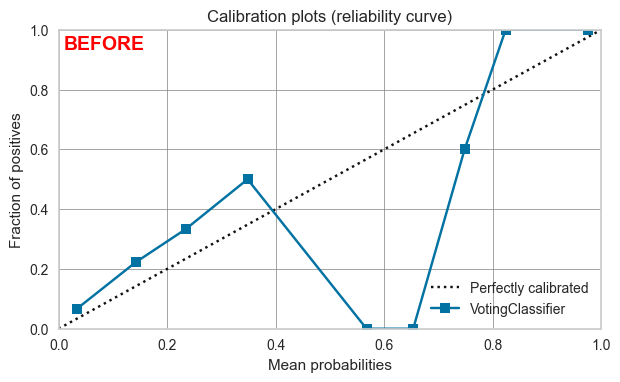

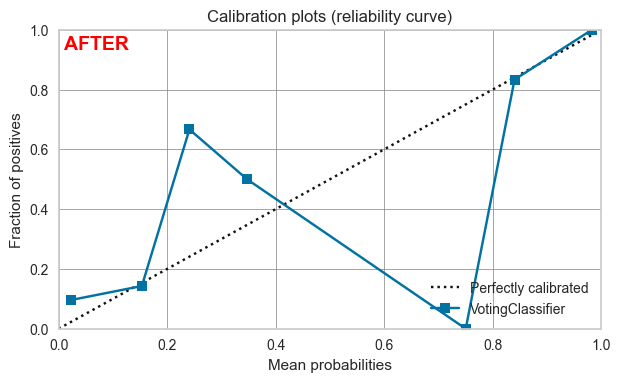

In [26]:
# -- Plot calibration curve before recalibration
ax0 = plot_calibration(exp, best_model)
plt.text(x=.01, y=.95, s='BEFORE', color='red',
         fontsize=14, fontweight='bold',
         ha='left', va='center')

# -- Plot calibration curve after recalibration
ax1 = plot_calibration(exp, best_model_calibrated)
plt.text(x=.01, y=.95, s='AFTER', color='red',
         fontsize=14, fontweight='bold',
         ha='left', va='center')

The calibration process does not bring any significative improvements in our case. Moreover, the resulting `AUC` is slightly worse than the original.

## Model evaluation

In this section, we will appreciate the performances of our best model so far by using some basic visualisation on particular metrics.

### Feature importance 

**Feature Importance** refers to techniques that calculate a **score** for all the input features for a given model, the scores simply represent the _"importance"_ of each feature. A higher score means that the specific feature will have a larger effect on the model that is being used to predict a certain variable.

There are different ways to calculate feature importance, but we will focus on the classic [**Gini importance**](https://doi.org/10.1007/s10888-011-9188-x). This is used to calculate the **node impurity** and **feature importance** is basically a reduction in the impurity of a node weighted by the number of samples that are reaching that node from the total number of samples.

Let's compute and evaluate the importance of each features on the `XGBClassifier` _(xgboost)_ since our `VotingClassifier` cannot compute the `Gini index`. 

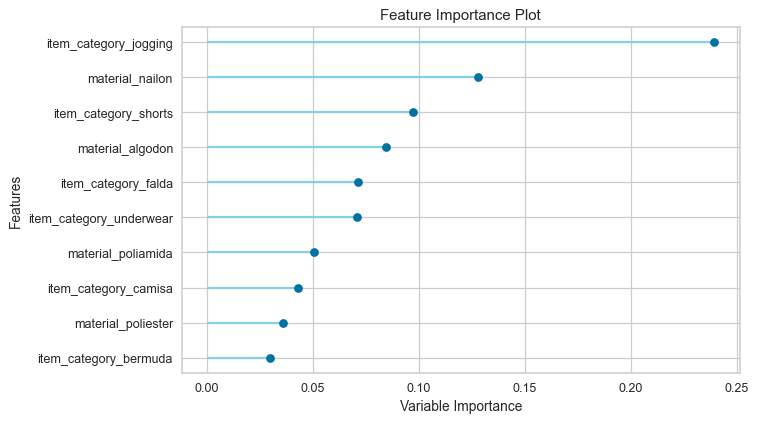

In [27]:
# -- Plot xgboost feature importance
exp.plot_model(best_naive_models[0], plot='feature', scale= .9)

It's seems that the `jogging` item category has the higher variance importance. However, there are only `9` items in this category. It can results that the **under-representativity** of this class can affect the model performance. As an improvement, it will be oportunate to group the `jogging` and `legging` categories in a new one named `sport`.

### Confusion matrix & AUC-ROC curves

The **confusion matrix** is like a summary of the prediction results for a particular classification problem. It compares the actual data for a target variable to that predicted by a model. **Correct** and **False** predictions are revealed and distributed by class, allowing them to be compared with defined values.

Also known as a contingency table, the confusion matrix is used to evaluate the performance of a classification model. It therefore shows how confusing a certain model can be when making predictions. In its simplest form, it is a `2X2` matrix.





The confusion matrix makes it possible to know the different errors committed by a prediction, but more importantly, to know the different **types of errors committed**. By analyzing them, it is possible to determine the results that indicate how these errors occurred.

+ A _negative_ case that is considered a _positive_ case **_(Type I Error)_**
+ A _positive_ case that is considered a _negative_ case **_(Type II Error)_**

<img align="left" src="./assets/confusion_matrix.jpg" style="height: 350px">

<br>

Let's compute and plot basic **confusion matrix**.

In [28]:
# -- Extract predicted probability
pp = best_model.predict_proba(exp.X_test_transformed)

In [29]:
# -- Plot confusion matrix (with bctools)
fig, *_ = bctools.confusion_matrix_plot(
    true_y=exp.y_test_transformed,
    predicted_proba=pp[:, 1],
)

# -- Show figure
fig.show()

# -- Plot confusion matrix (with pycaret)
# exp.plot_model(best_model,
#                plot='confusion_matrix',
#                scale=.7,
#                plot_kwargs={'percent': 'True', 'cmap': 'BuGn'})


We can notice a significant of amount **False Positive** predictions, i.e. garment items that will be predicted as _eco-labeled_ when in fact they are not!


<img align="left" src="./assets/ROC-AUC.png" style="height: 250px">

Like the **confusion matrix**, the **AUC - ROC curve** is a performance measurement for the classification problems at various threshold settings. **ROC** _Receiver Operating Characteristics_ is a probability curve and **AUC** represents the degree or measure of separability.

It tells how much the model is capable of distinguishing between classes. Higher the **AUC**, the better the model is at predicting `1` when the item is _eco-labeled_ and _vice versa_.

The **ROC curve** is plotted with **TPR** (_y-axis_) against the **FPR** (_x-axis_).

The dashed curve represents the baseline corresponding to the dummy curve of a naive model that guesses the target class randomly.

<br>
<br>

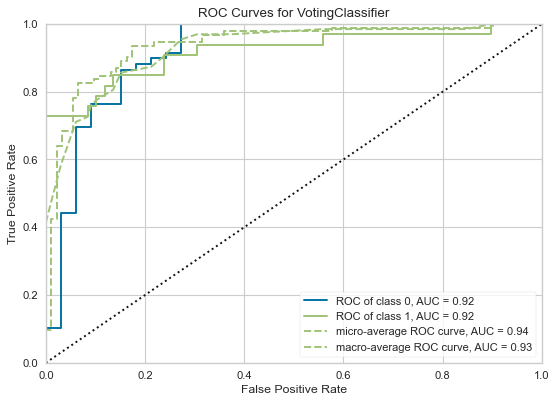

In [30]:
# -- Plot ROC curve
fig, auc = bctools.curve_ROC_plot(
    true_y = exp.y_test_transformed,
    predicted_proba = pp[:, 1]
)

# -- Show figure
fig.update_layout(height=500)
fig.show()

# # -- Plot ROC curve (with pycaret)
exp.plot_model(best_model, plot = 'auc',  scale=.8)

The **PR** _(precision-recall)_ plot is another commun graphical representation of the performance of a classification model, particularly for imbalanced datasets where one class is much rarer than the other. It shows the **trade-off** between **precision** _(positive predictive value)_ and **recall** _(sensitivity or true positive rate)_ for different classification thresholds.

Precision is plotted on the _y-axis_, while recall is plotted on the _x-axis_. Each point on the plot represents a different threshold used to classify observations as _positive_ or _negative_. The precision and recall values for that **threshold** are calculated based on the **TP**, **FP**, **TN**, and **FN** rates of the model.

A perfect classifier would have both high precision and high recall, meaning it correctly identifies all positive cases (high recall) and correctly identifies only positive cases (high precision). However, in reality, there is usually a trade-off between the two measures, as increasing one often leads to a decrease in the other.

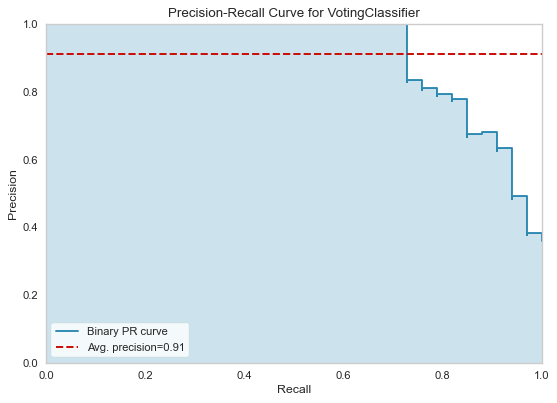

In [31]:
# -- Plot PR curve (with bctools)
fig, _ = bctools.curve_PR_plot(
    true_y = exp.y_test_transformed,
    predicted_proba = pp[:, 1]
)

# -- Show figure
fig.update_layout(height=500)
fig.show()

# # -- Plot PR curve (with pycaret)
exp.plot_model(best_model, plot = 'pr',  scale=.8)

Since the binary classifier can predict the probability of each prediction, we can plot the distribution of each predicted target classes smoothing the histogram bins using `KDE` method.

In [32]:
# -- Plot target classes probabilities
fig = bctools.predicted_proba_density_curve_plot(
    true_y=exp.y_test_transformed,
    predicted_proba=pp[:, 1],
    threshold_step=.01,
    curve_type='kde',
)

# -- Show figure
fig.update_layout(height=675, width=900)
fig.show()

### Gain chart 

Another good evaluating plot for binary classification problem is the **gain chart**. It's a graphical representation of the cumulative percentage of **positive observations** (y-axis)_ against the _cumulative percentage of **total observations** _(x-axis)_, ordered by their predicted probability of belonging to the positive class.

In other words, the gain chart shows how many true positives (or how much **gain**) we can achieve by selecting a certain percentage of the population with the highest predicted probabilities, while the **ROC curve** shows how well the model distinguishes between positive and negative classes across all possible classification thresholds.

Another difference between the two is that the ROC curve is more useful when the cost of **FP** and **FN** is equal, while the gain chart is more useful when the cost of **FP** and **FN** is different. This is because the gain chart can take into account the relative costs of different types of errors by changing the shape of the curve.

Let's try to plot gain chart for either _eco-_ and _non eco-labeled_ items.

In [33]:
# -- Plot gain chart
fig = bctools.cumulative_gain_plot(
    true_y=exp.y_test_transformed,
    full_predicted_proba=pp
)

# -- Show figure
fig.update_layout(height=500, width=650, hovermode='x')
fig.show()

Class 0 is associated with probabilities: full_predicted_proba[:, 0]
Class 1 is associated with probabilities: full_predicted_proba[:, 1]


### Other evaluations 

To sum up all model evaluations let's build a **interactive plotting application** in which we can interact clicking each required plots.

In [ ]:
# -- Interactive evaluation
exp.evaluate_model(best_model)

## Finilazing / saving process

We are now able to finalizing our study. Let's save the experiment and model.

In [34]:
# -- Finalize model pipeline
final_model = exp.finalize_model(best_model)
final_model

In [ ]:
# -- Save model only
exp.save_model(best_model, os.path.join('store', 'models','Voting_Classifier_Model'), model_only=True)

# -- Save whole pipeline
exp.save_model(final_model, os.path.join('store', 'models','Voting_Classifier_Pipeline'))

# -- Save experiment
exp.save_experiment(os.path.join('store', 'Binary_classification_experiment'))

This is the end of this `Binary Classification` study. But wait, if you want more, you can visualize a summary of this machine learning work via interactive **dashboard** by write the following code on your _terminal_:

```shell
python dashboard.py
```

Or if you want to make a predict test, just write:

```shell
python app.py
```